In [1]:
import tensorflow as tf
import os
import numpy as np
import random

import glob
import cv2

from tqdm import tqdm
from skimage.io import imread, imshow
from skimage.transform import resize
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import save_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import array_to_img


from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Activation, MaxPool2D, Concatenate

In [ ]:
pip install git+https://github.com/artemmavrin/focal-loss.git

In [ ]:
from focal_loss import BinaryFocalLoss

In [2]:
''' import dataset and masks '''
x_train = np.load('C:/Users/User.DESKTOP-G63UU5V/Desktop/MARIO/unet/code/x_train-2.npy')
y_train = np.load('C:/Users/User.DESKTOP-G63UU5V/Desktop/MARIO/unet/code/y_train-2.1.npy')

In [3]:
print(x_train.shape) # 988,512,512,1
print(y_train.shape) # 988,512,512,1
print("Labels in the mask are : ", np.unique(y_train)) # [0 1 2 3]

(988, 512, 512, 1)
(988, 512, 512, 1)
Labels in the mask are :  [0 1 2 3]


In [4]:
''' normalise images '''
x_train = x_train / 255

In [5]:
''' Split training data '''
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(x_train, y_train, test_size = 0.2, random_state = 42)

In [8]:
from tensorflow.keras.utils import to_categorical
train_masks_cat = to_categorical(Y_train, num_classes=4)
y_train_cat = train_masks_cat.reshape((Y_train.shape[0], Y_train.shape[1], Y_train.shape[2], 4))

test_masks_cat = to_categorical(Y_test, num_classes=4)
y_test_cat = test_masks_cat.reshape((Y_test.shape[0], Y_test.shape[1], Y_test.shape[2], 4))

In [9]:
print(y_train_cat.shape) # (790, 512, 512, 7)
print(y_test_cat.shape) # (198, 512, 512, 7) total: 790 + 198 = 988
print(X_train.shape[3])

(790, 512, 512, 4)
(198, 512, 512, 4)
1


In [10]:
IMG_HEIGHT = X_train.shape[1]
IMG_WIDTH  = X_train.shape[2]
IMG_CHANNELS = X_train.shape[3]
n_classes = 4
input_shape = (IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS)
print(input_shape) # (512, 512, 1)

(512, 512, 1)


In [11]:
''' U-NET '''

def multi_unet_model(n_classes, IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS):
#Build the model
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    #s = Lambda(lambda x: x / 255)(inputs)   #No need for this if we normalize our inputs beforehand
    s = inputs

    #Contraction path
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s)
    c1 = Dropout(0.1)(c1)
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)
    
    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
    c2 = Dropout(0.1)(c2)
    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)
     
    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
    c3 = Dropout(0.2)(c3)
    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)
     
    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
    c4 = Dropout(0.2)(c4)
    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
    p4 = MaxPooling2D(pool_size=(2, 2))(c4)
     
    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
    c5 = Dropout(0.3)(c5)
    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)
    
    #Expansive path 
    u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = concatenate([u6, c4])
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
    c6 = Dropout(0.2)(c6)
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)
     
    u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
    c7 = Dropout(0.2)(c7)
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)
     
    u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
    c8 = Dropout(0.1)(c8)
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)
     
    u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = concatenate([u9, c1], axis=3)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
    c9 = Dropout(0.1)(c9)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)
     
    outputs = Conv2D(n_classes, (1, 1), activation='softmax')(c9)
     
    model = Model(inputs=[inputs], outputs=[outputs])
    
    #NOTE: Compile the model in the main program to make it easy to test with various loss functions
    #model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    
    #model.summary()
    
    return model

In [12]:
def get_model():
    return multi_unet_model(n_classes=n_classes, IMG_HEIGHT=IMG_HEIGHT, IMG_WIDTH=IMG_WIDTH, IMG_CHANNELS=IMG_CHANNELS)

model = get_model()
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
# model.summary()

In [13]:
# model checkpoint
# checkpointer = tf.keras.callbacks.ModelCheckpoint('qc-march2022.h5', verbose=1, save_best_only=True)
# callbacks = [tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'), 
#              tf.keras.callbacks.TensorBoard(log_dir='logs'), checkpointer]

# results = model.fit(X_train, y_train_cat, X_test, y_test_cat, batch_size=32, epochs=100, callbacks=callbacks)

model.fit(X_train, y_train_cat, 
                    batch_size = 16, 
                    verbose=1, 
                    epochs=60, 
                    validation_data=(X_test, y_test_cat), 
                    #class_weight=class_weights,
#                     callbacks=callbacks
                   )

Train on 790 samples, validate on 198 samples
Epoch 1/60
790/790 [==============================] - 476s 602ms/sample - loss: 0.5442 - accuracy: 0.8253 - val_loss: 0.4198 - val_accuracy: 0.8914
Epoch 2/60
790/790 [==============================] - 478s 605ms/sample - loss: 0.4124 - accuracy: 0.8958 - val_loss: 0.4172 - val_accuracy: 0.8914
Epoch 3/60
790/790 [==============================] - 470s 595ms/sample - loss: 0.4057 - accuracy: 0.8959 - val_loss: 0.4127 - val_accuracy: 0.8914
Epoch 4/60
790/790 [==============================] - 470s 595ms/sample - loss: 0.4005 - accuracy: 0.8959 - val_loss: 0.4144 - val_accuracy: 0.8914
Epoch 5/60
790/790 [==============================] - 470s 595ms/sample - loss: 0.3939 - accuracy: 0.8970 - val_loss: 0.5382 - val_accuracy: 0.8789
Epoch 6/60
790/790 [==============================] - 470s 595ms/sample - loss: 0.3857 - accuracy: 0.9029 - val_loss: 0.3951 - val_accuracy: 0.9006
Epoch 7/60
790/790 [==============================] - 469s 594ms/s

Epoch 56/60
790/790 [==============================] - 488s 618ms/sample - loss: 0.0867 - accuracy: 0.9726 - val_loss: 0.2033 - val_accuracy: 0.9529
Epoch 57/60
790/790 [==============================] - 488s 618ms/sample - loss: 0.0843 - accuracy: 0.9731 - val_loss: 0.1629 - val_accuracy: 0.9573
Epoch 58/60
790/790 [==============================] - 488s 617ms/sample - loss: 0.0817 - accuracy: 0.9741 - val_loss: 0.1704 - val_accuracy: 0.9563
Epoch 59/60
790/790 [==============================] - 489s 619ms/sample - loss: 0.0791 - accuracy: 0.9749 - val_loss: 0.1789 - val_accuracy: 0.9547
Epoch 60/60
790/790 [==============================] - 486s 616ms/sample - loss: 0.0773 - accuracy: 0.9752 - val_loss: 0.1809 - val_accuracy: 0.9560


In [14]:
model.save('mario-apr2022.hdf5')
#model.save('sandstone_50_epochs_catXentropy_acc_with_weights.hdf5')
############################################################
#Evaluate the model

_, acc = model.evaluate(X_test, y_test_cat)
print("Accuracy is = ", (acc * 100.0), "%")

198/198 [==============================] - 19s 95ms/sample - loss: 0.1809 - accuracy: 0.9560
Accuracy is =  95.59594392776489 %


In [15]:
model.load_weights = ('C:/Users/User.DESKTOP-G63UU5V/Desktop/MARIO/unet/code/mario-apr2022.hdf5')

In [16]:
y_pred=model.predict(X_test)

In [17]:
y_pred.shape

(198, 512, 512, 4)

In [18]:
y_pred_argmax=np.argmax(y_pred, axis=3)
y_pred_argmax.shape

(198, 512, 512)

In [21]:
from tensorflow.keras.metrics import MeanIoU
n_classes = 4
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(y_test_cat[:,:,:,0], y_pred_argmax)
print("Mean IoU =", IOU_keras.result().numpy())

Mean IoU = 0.009416698


In [26]:
# IoU
def iou_calc(label, binarized_seg):
#     image1 = cv2.imread(label, 0)
#     image1_1 = resize(image1, (IMG_HEIGHT, IMG_WIDTH), preserve_range=True)
#     plt.imshow(image1_1, cmap = 'gray')
#     plt.show()
    
#     plt.imshow(binarized_seg, cmap='gray')
#     plt.show()
    
    # IoU calculation
    intersection = np.logical_and(label, binarized_seg) 
    union = np.logical_or(label, binarized_seg)
    iou_score = np.sum(intersection) / np.sum(union)
    print('IoU is', iou_score)

45


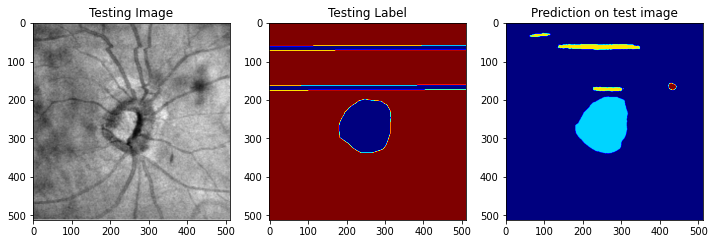

IoU is 0.007967132110040808


In [29]:
import random
test_img_number = random.randint(0, len(X_test)-1)
test_img = X_test[test_img_number]
ground_truth=y_test_cat[test_img_number]
test_img_norm=test_img[:,:,0][:,:,None]
test_img_input=np.expand_dims(test_img_norm, 0)
prediction = (model.predict(test_img_input))
predicted_img=np.argmax(prediction, axis=3)[0,:,:]

print(test_img_number)
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,0], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(ground_truth[:,:,0], cmap='jet')
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(predicted_img, cmap='jet')
plt.show()
iou_calc(ground_truth[:,:,0], predicted_img)

In [ ]:
import random
test_img_number = random.randint(0, len(X_test)-1)
test_img = X_test[test_img_number]
ground_truth=y_test_cat[test_img_number]
test_img_norm=test_img[:,:,0][:,:,None]
test_img_input=np.expand_dims(test_img_norm, 0)
prediction = (model.predict(test_img_input))
predicted_img=np.argmax(prediction, axis=3)[0,:,:]

print(test_img_number)
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,0], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(ground_truth[:,:,0], cmap='rainbow')
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(predicted_img, cmap='rainbow')
plt.show()

In [ ]:
import random
test_img_number = random.randint(0, len(X_test)-1)
test_img = X_test[test_img_number]
ground_truth=y_test_cat[test_img_number]
test_img_norm=test_img[:,:,0][:,:,None]
test_img_input=np.expand_dims(test_img_norm, 0)
prediction = (model.predict(test_img_input))
predicted_img=np.argmax(prediction, axis=3)[0,:,:]

print(test_img_number)
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,0], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(ground_truth[:,:,0], cmap='nipy_spectral')
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(predicted_img, cmap='gray')
plt.show()

1 /198


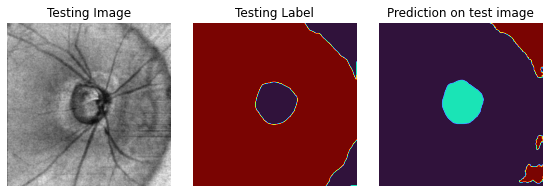

2 /198


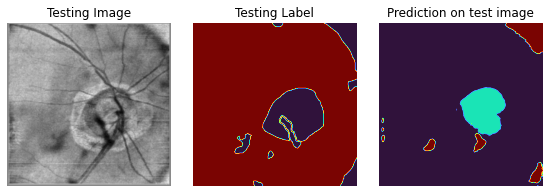

3 /198


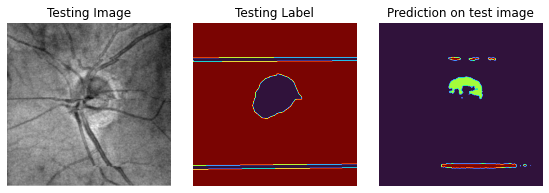

4 /198


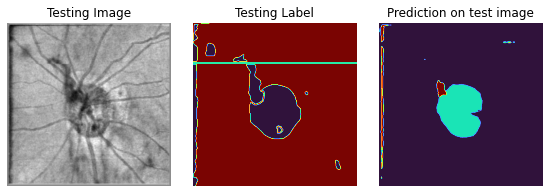

5 /198


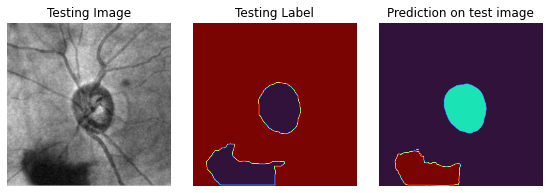

6 /198


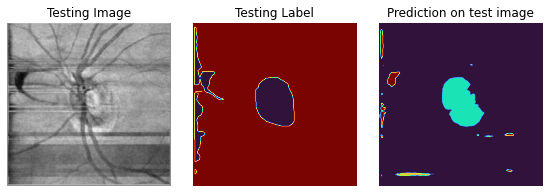

7 /198


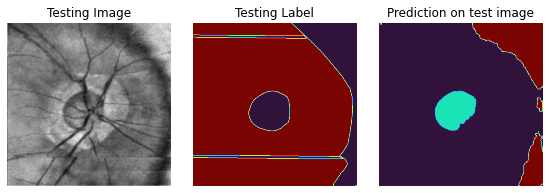

8 /198


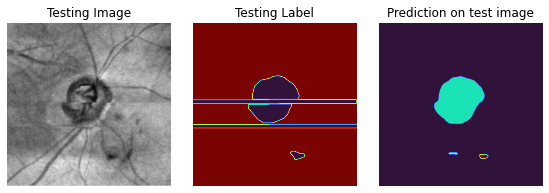

9 /198


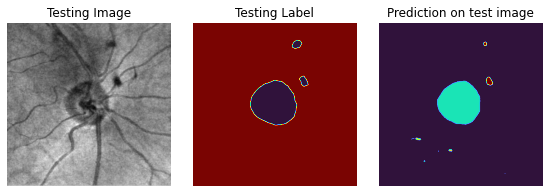

10 /198


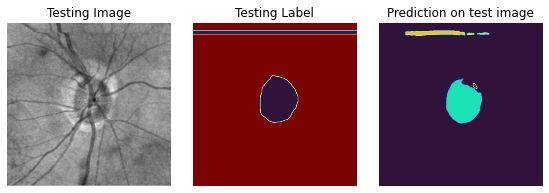

11 /198


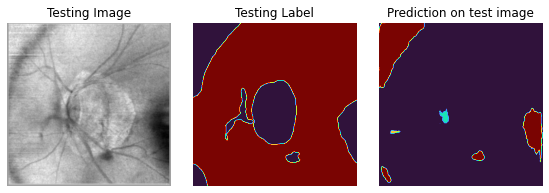

12 /198


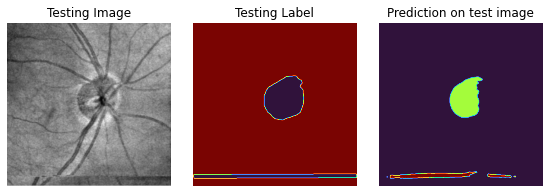

13 /198


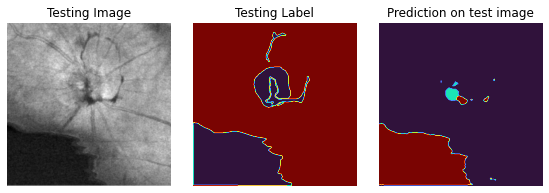

14 /198


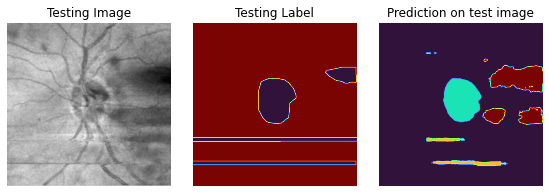

15 /198


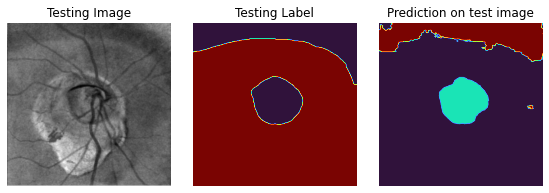

16 /198


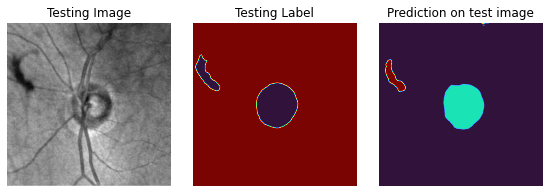

17 /198


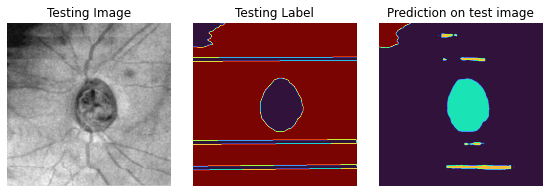

18 /198


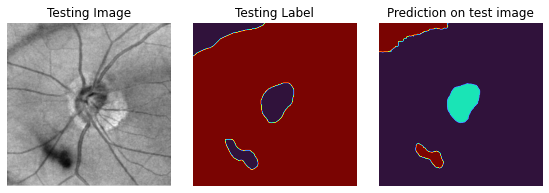

19 /198


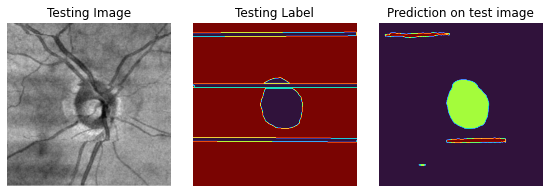

20 /198


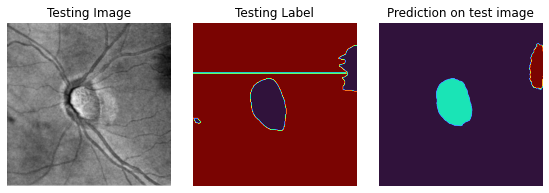

21 /198


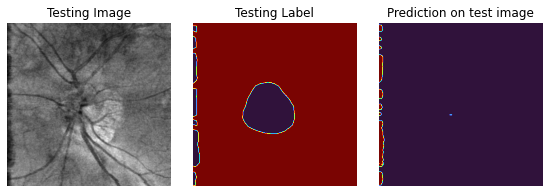

22 /198


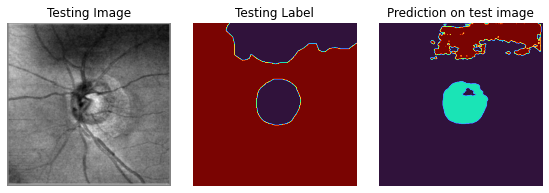

23 /198


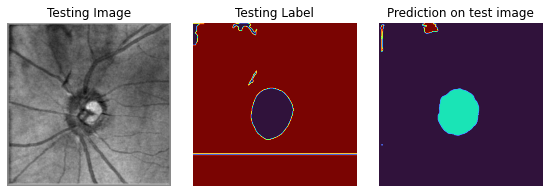

24 /198


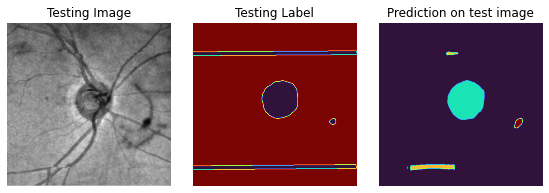

25 /198


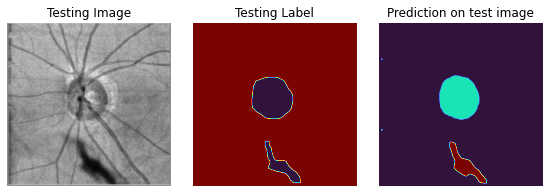

26 /198


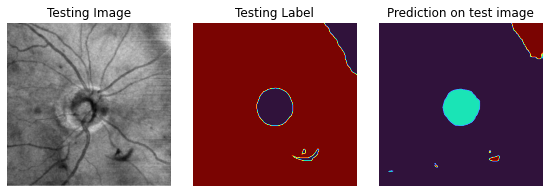

27 /198


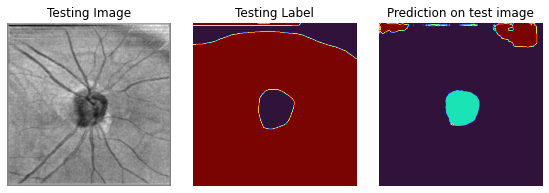

28 /198


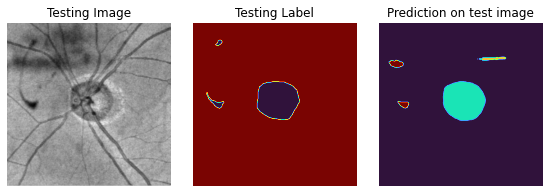

29 /198


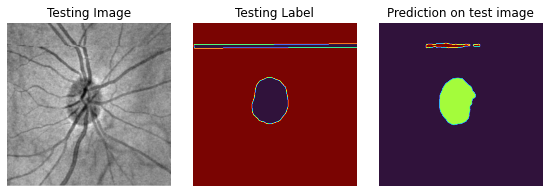

30 /198


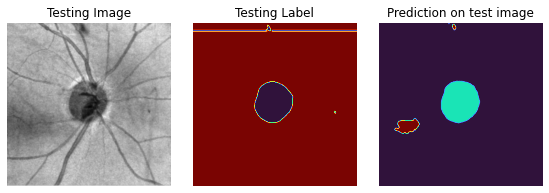

31 /198


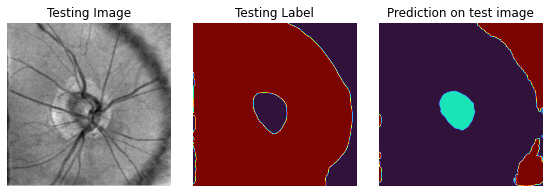

32 /198


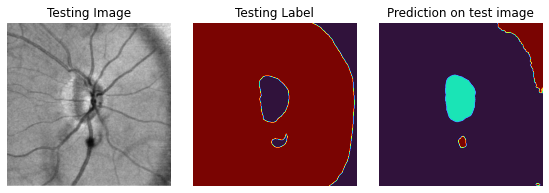

33 /198


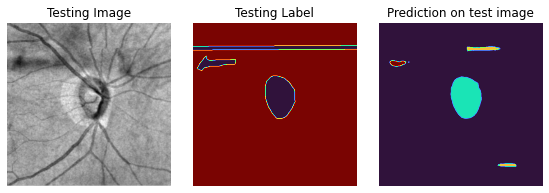

34 /198


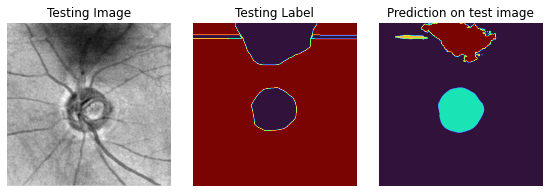

35 /198


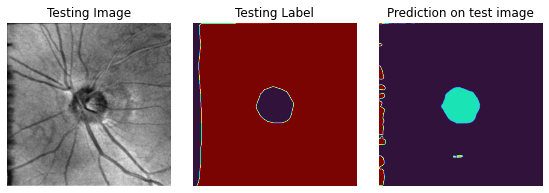

36 /198


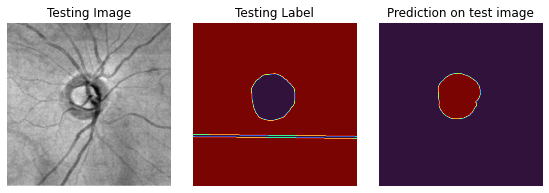

37 /198


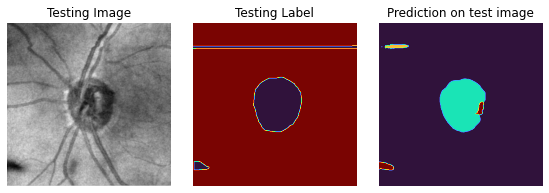

38 /198


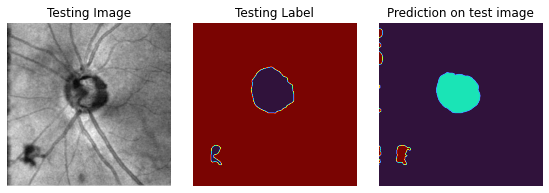

39 /198


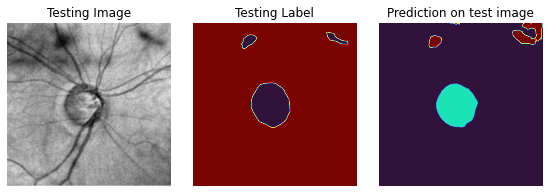

40 /198


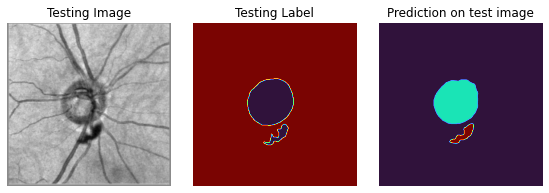

41 /198


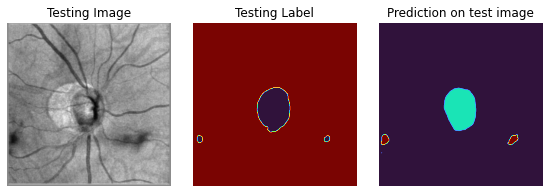

42 /198


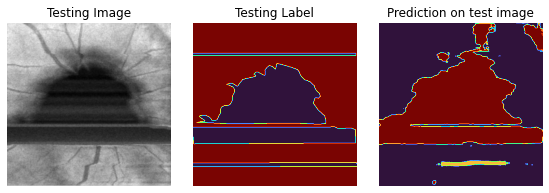

43 /198


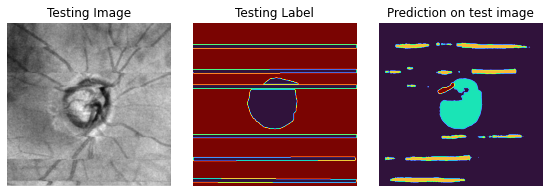

44 /198


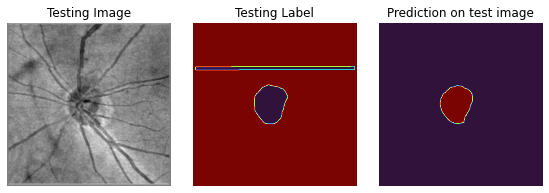

45 /198


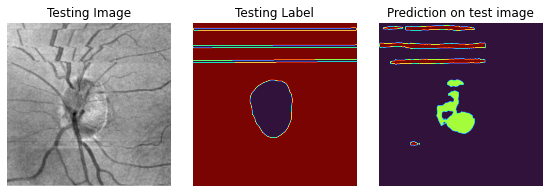

46 /198


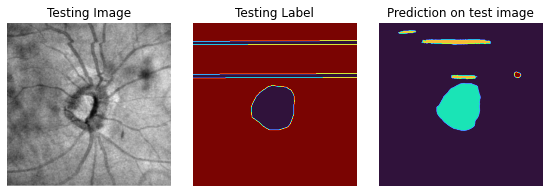

47 /198


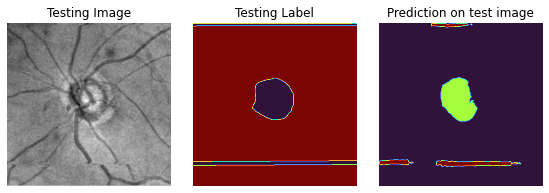

48 /198


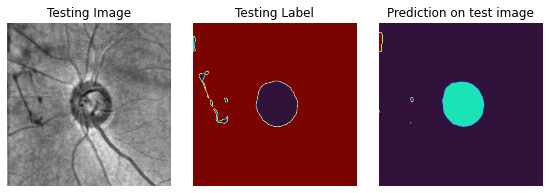

49 /198


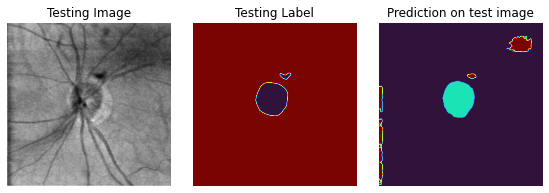

50 /198


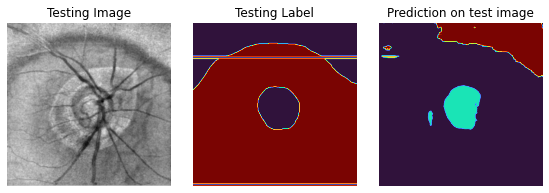

51 /198


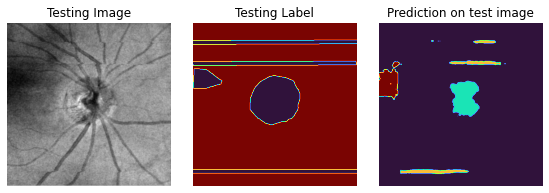

52 /198


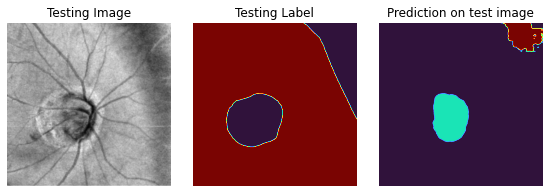

53 /198


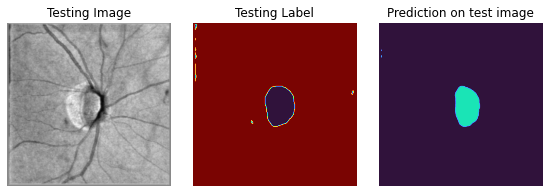

54 /198


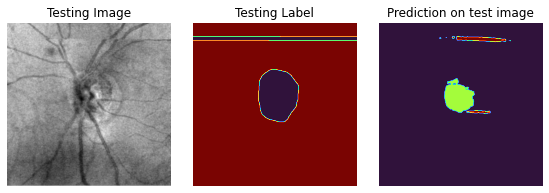

55 /198


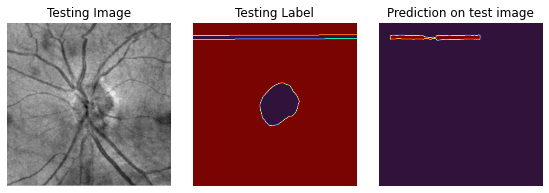

56 /198


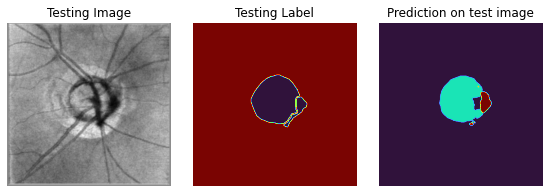

57 /198


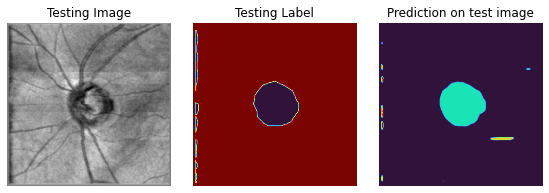

58 /198


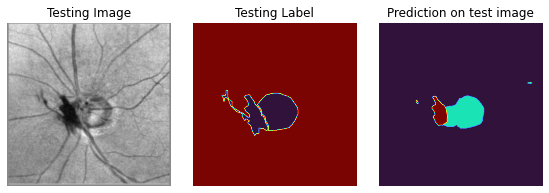

59 /198


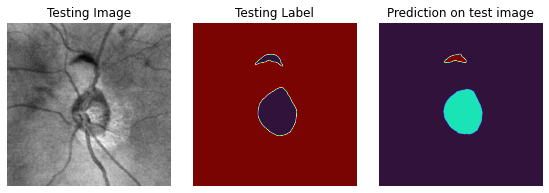

60 /198


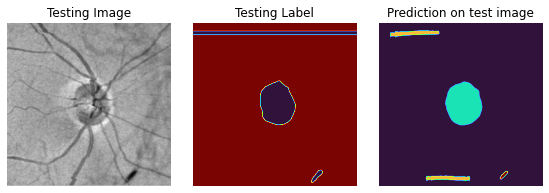

61 /198


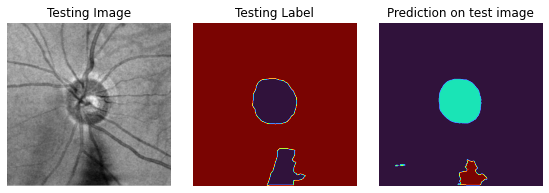

62 /198


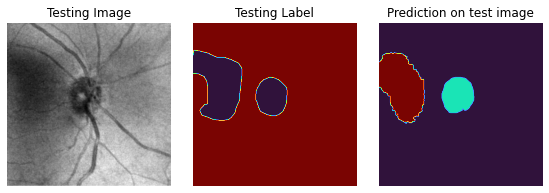

63 /198


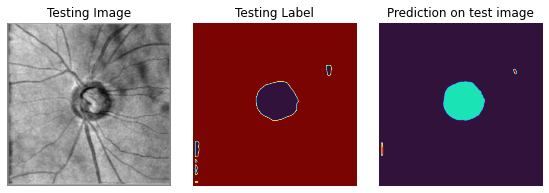

64 /198


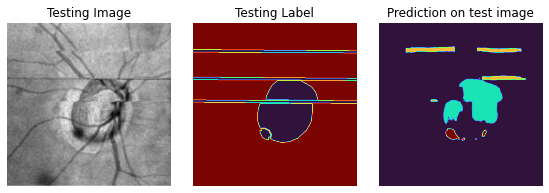

65 /198


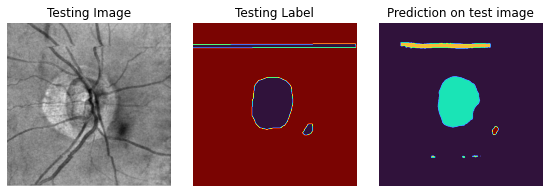

66 /198


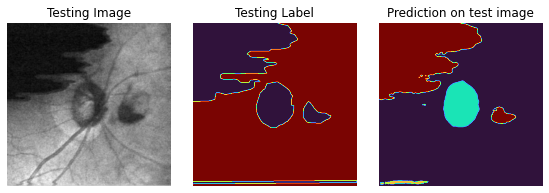

67 /198


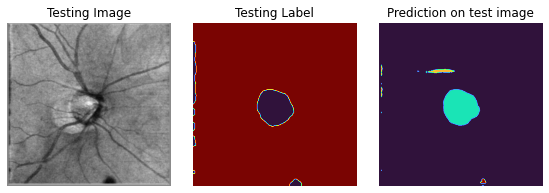

68 /198


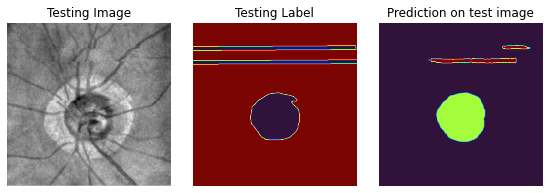

69 /198


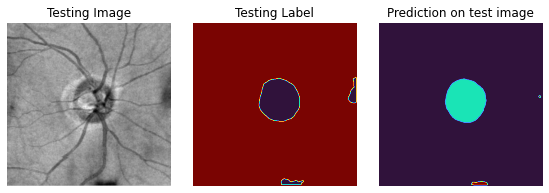

70 /198


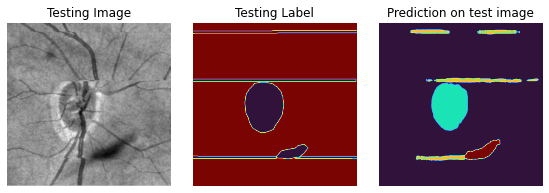

71 /198


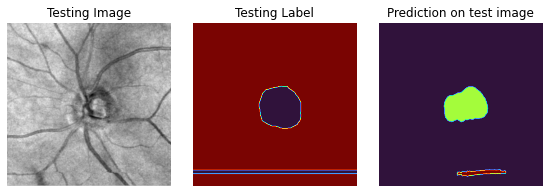

72 /198


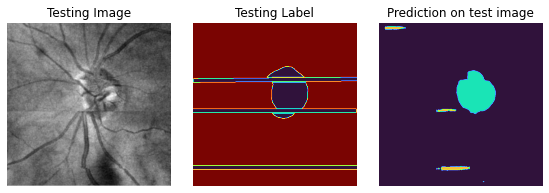

73 /198


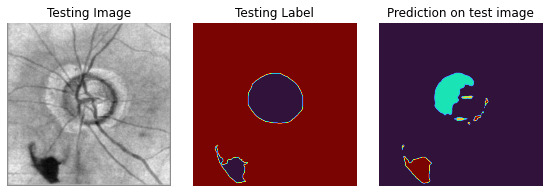

74 /198


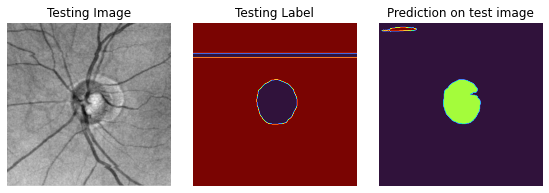

75 /198


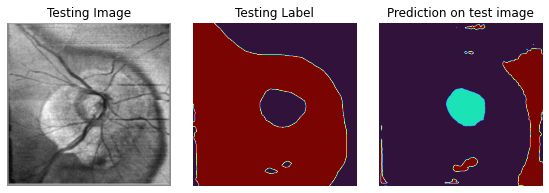

76 /198


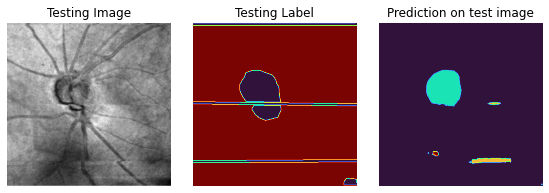

77 /198


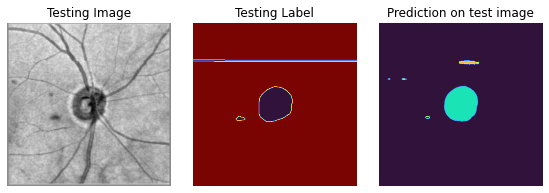

78 /198


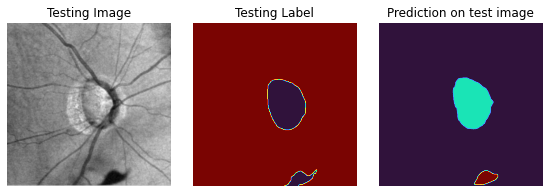

79 /198


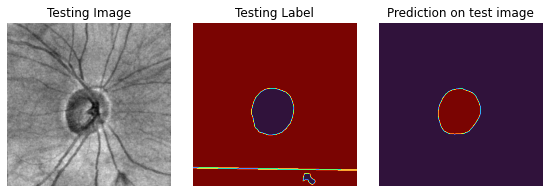

80 /198


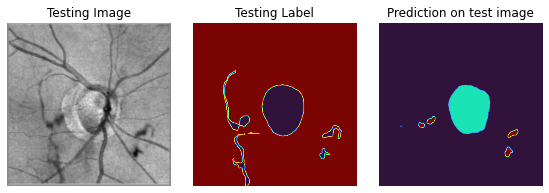

81 /198


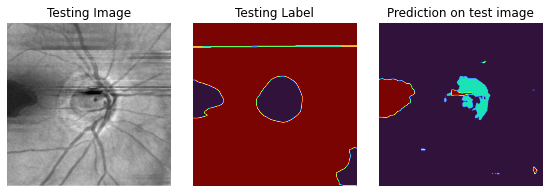

82 /198


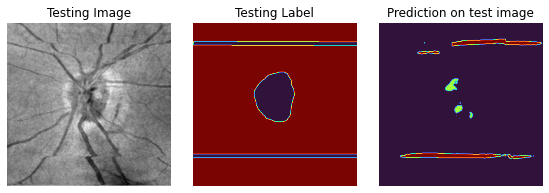

83 /198


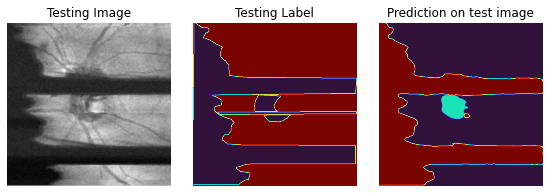

84 /198


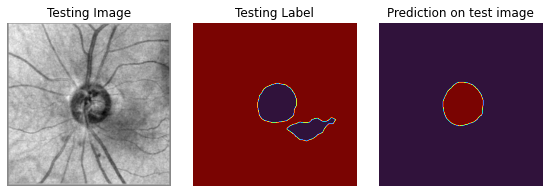

85 /198


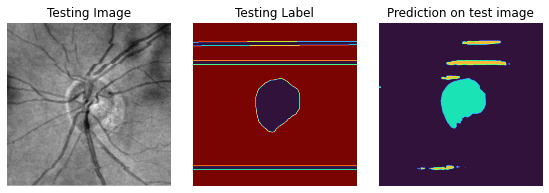

86 /198


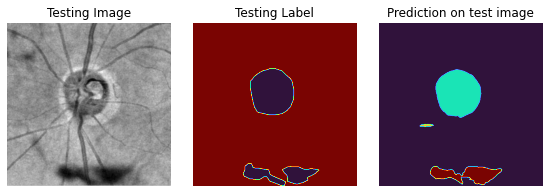

87 /198


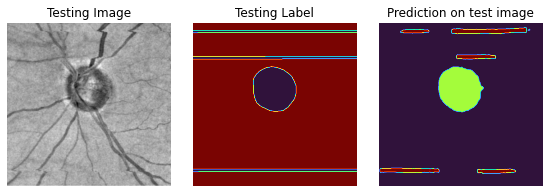

88 /198


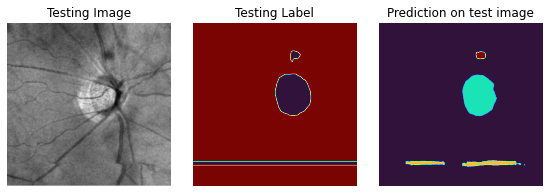

89 /198


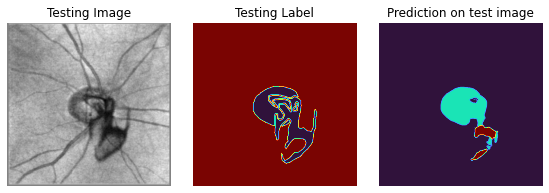

90 /198


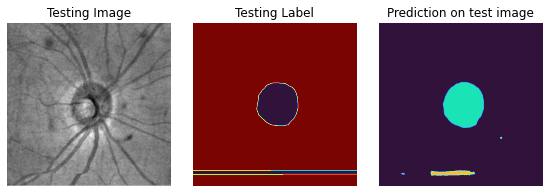

91 /198


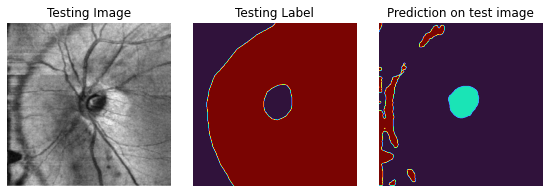

92 /198


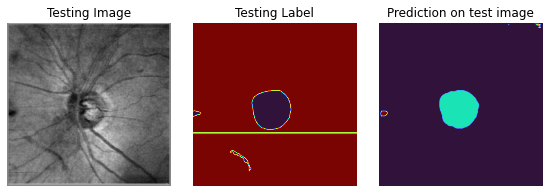

93 /198


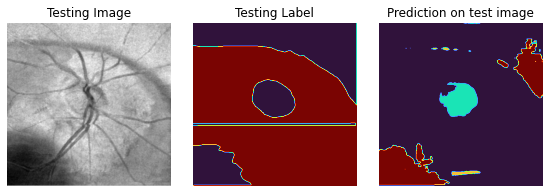

94 /198


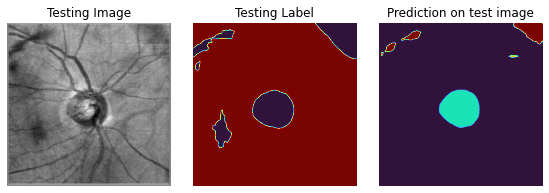

95 /198


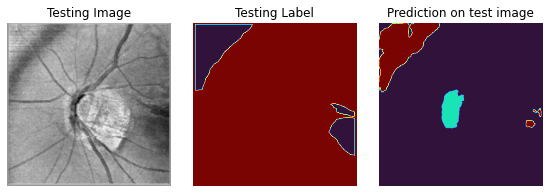

96 /198


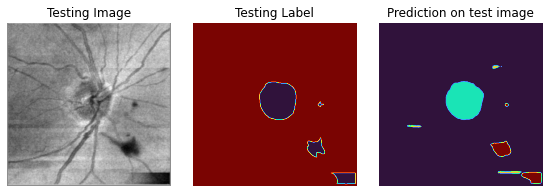

97 /198


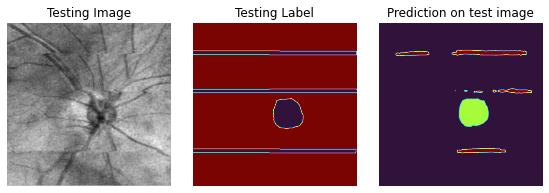

98 /198


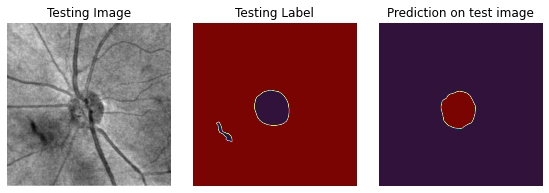

99 /198


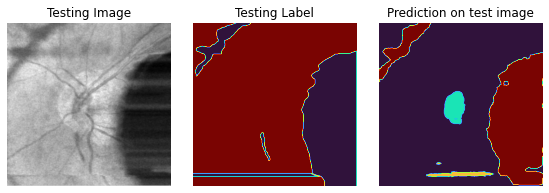

100 /198


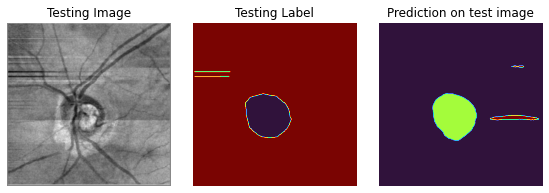

101 /198


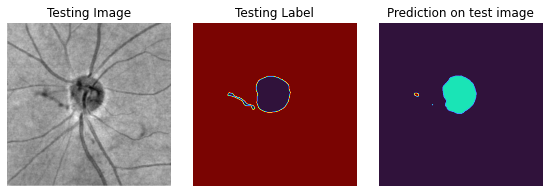

102 /198


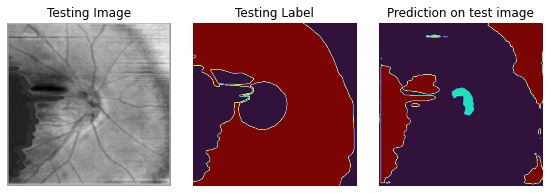

103 /198


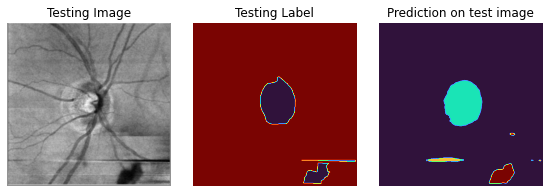

104 /198


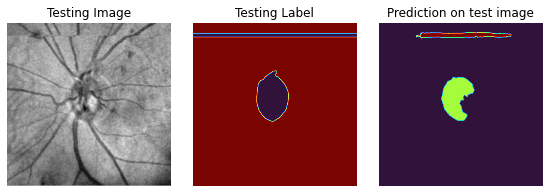

105 /198


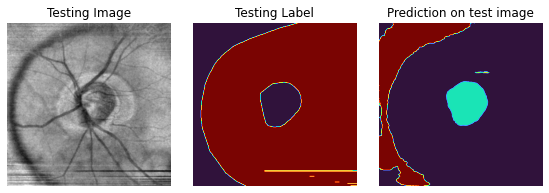

106 /198


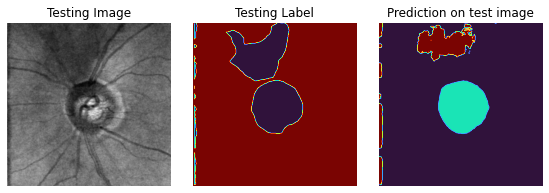

107 /198


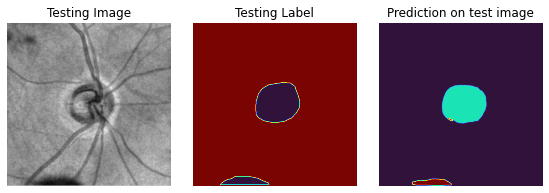

108 /198


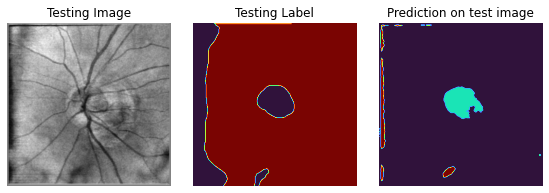

109 /198


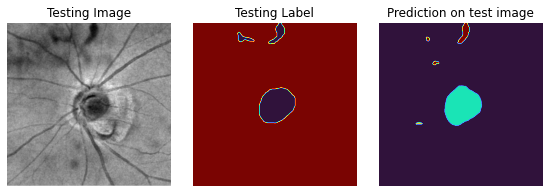

110 /198


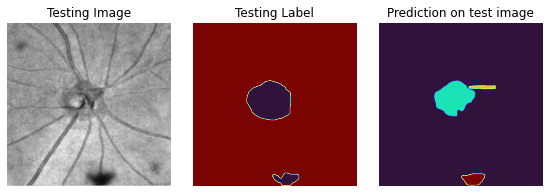

111 /198


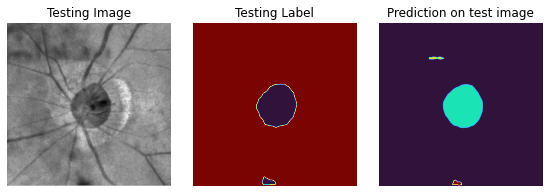

112 /198


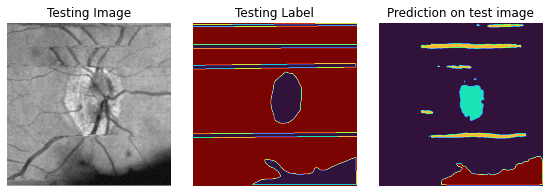

113 /198


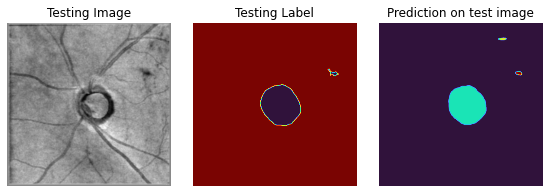

114 /198


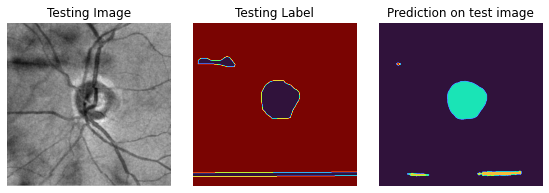

115 /198


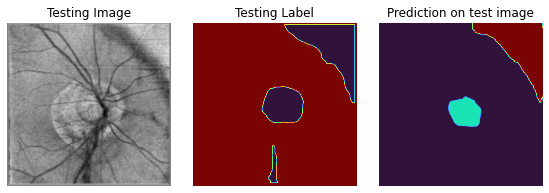

116 /198


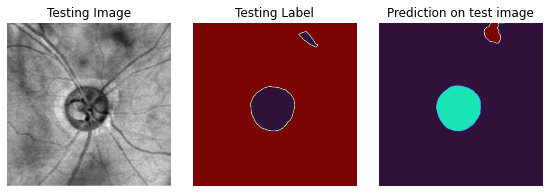

117 /198


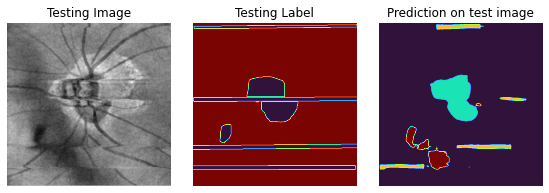

118 /198


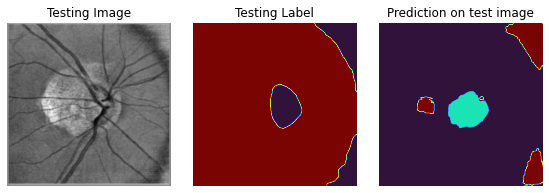

119 /198


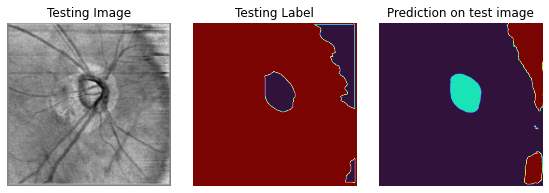

120 /198


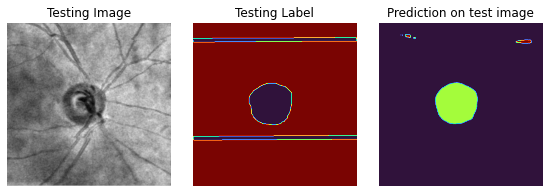

121 /198


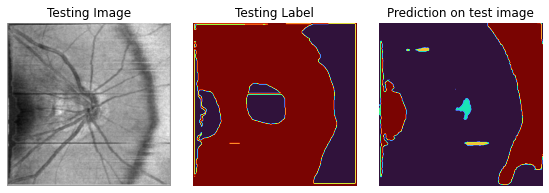

122 /198


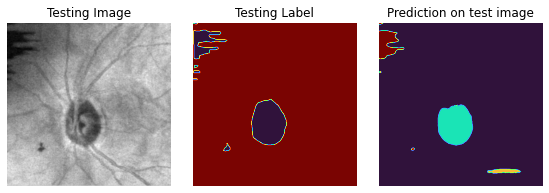

123 /198


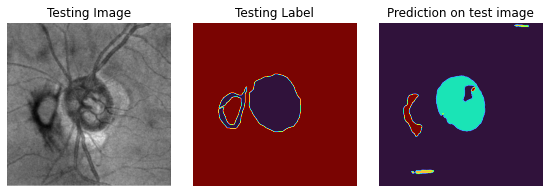

124 /198


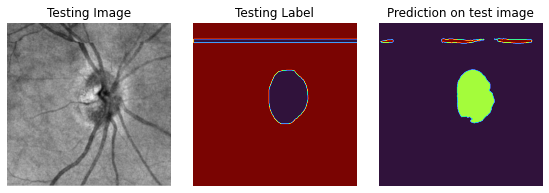

125 /198


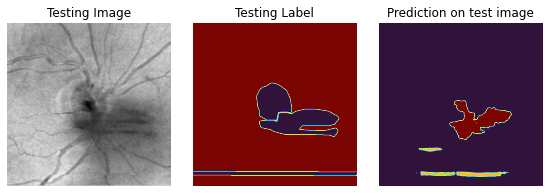

126 /198


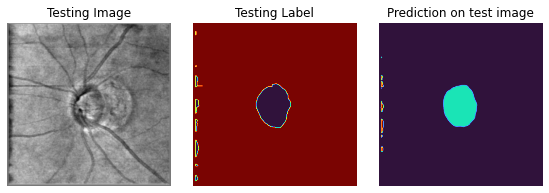

127 /198


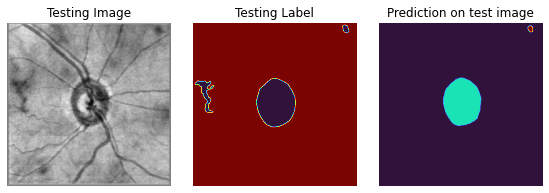

128 /198


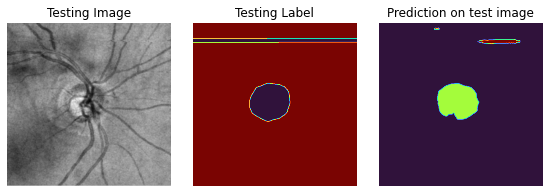

129 /198


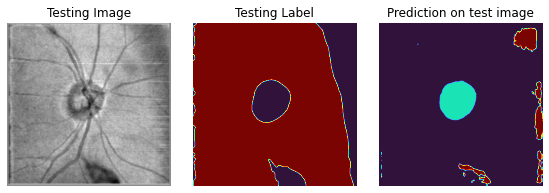

130 /198


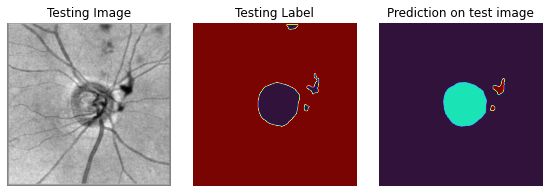

131 /198


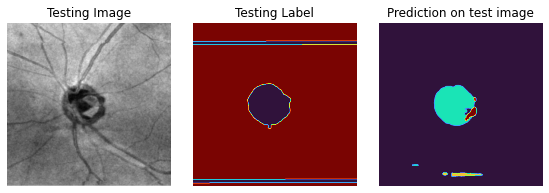

132 /198


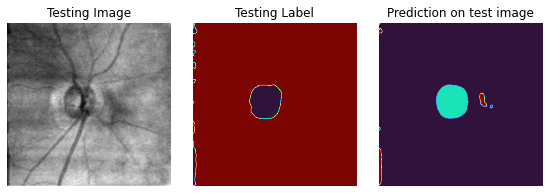

133 /198


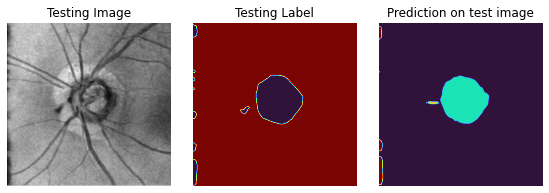

134 /198


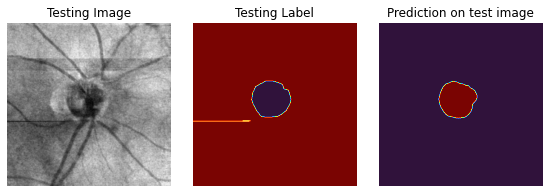

135 /198


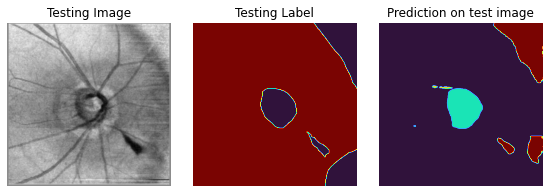

136 /198


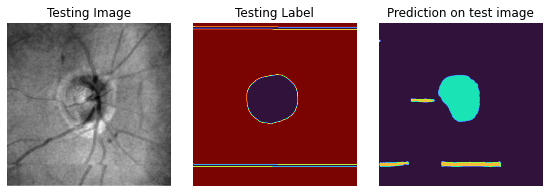

137 /198


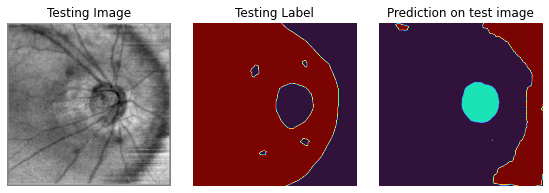

138 /198


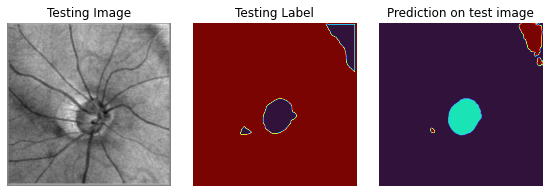

139 /198


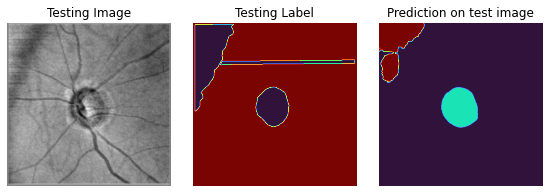

140 /198


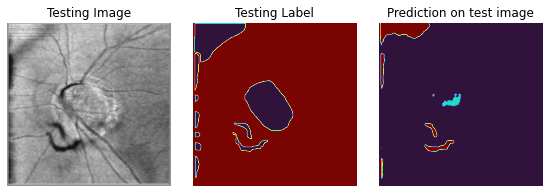

141 /198


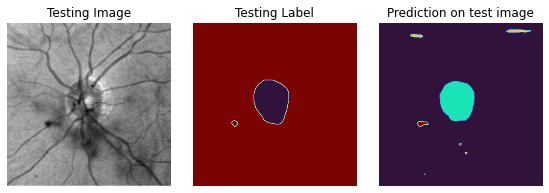

142 /198


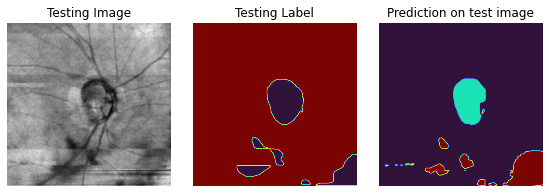

143 /198


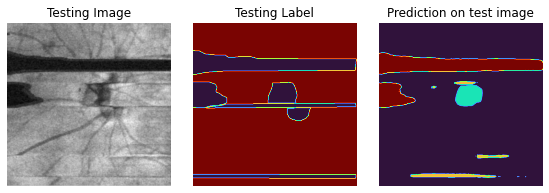

144 /198


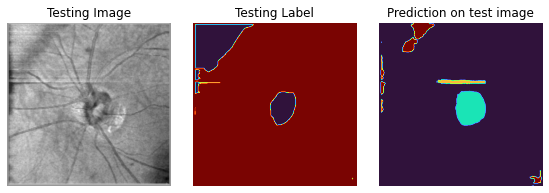

145 /198


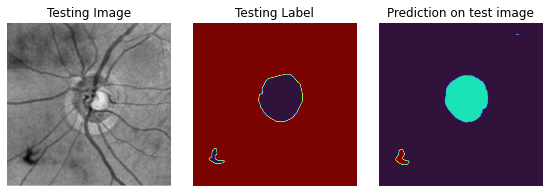

146 /198


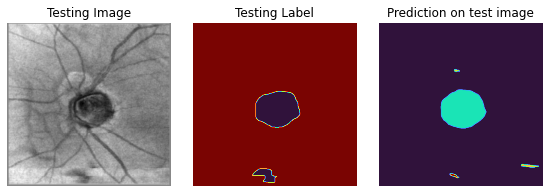

147 /198


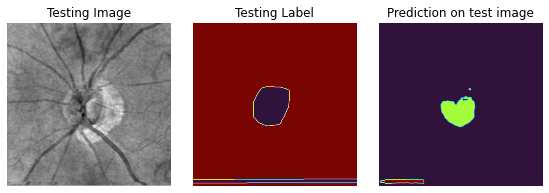

148 /198


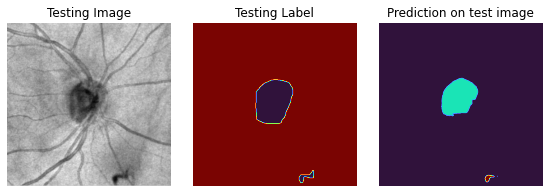

149 /198


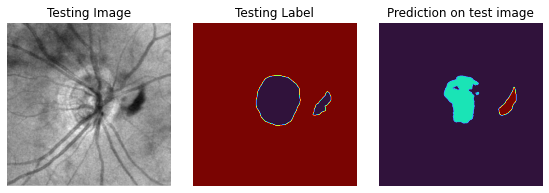

150 /198


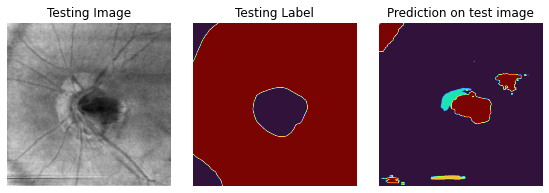

151 /198


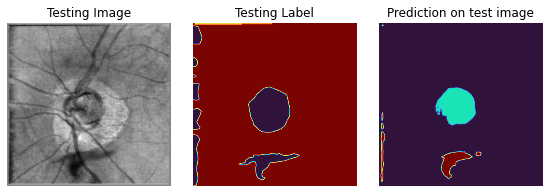

152 /198


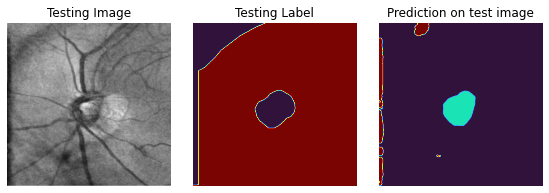

153 /198


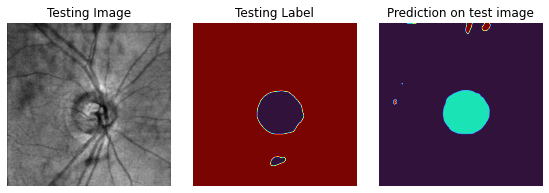

154 /198


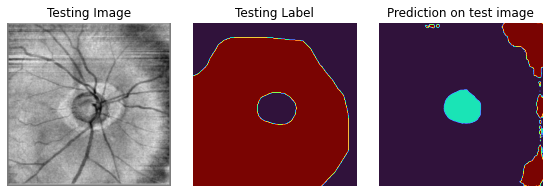

155 /198


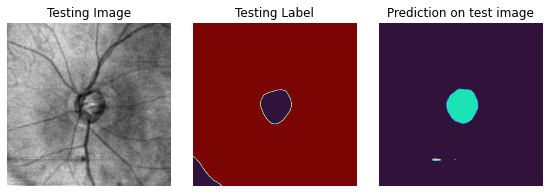

156 /198


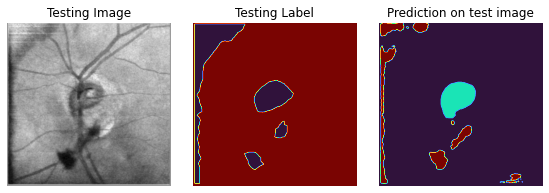

157 /198


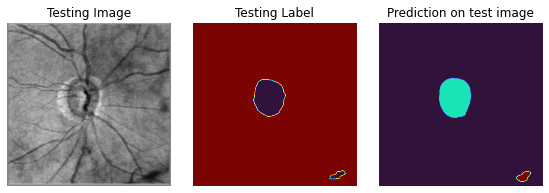

158 /198


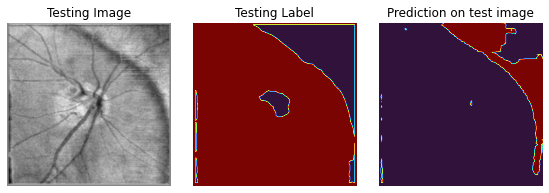

159 /198


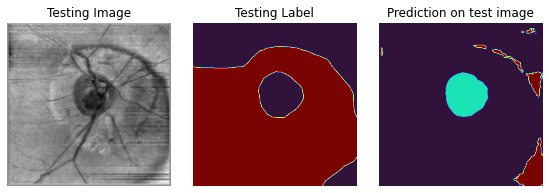

160 /198


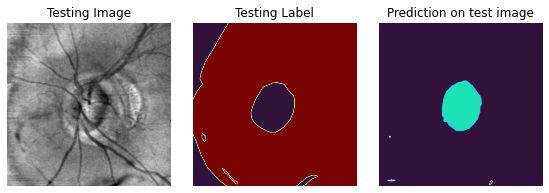

161 /198


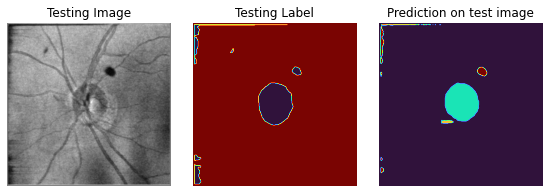

162 /198


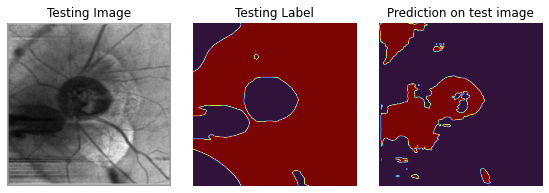

163 /198


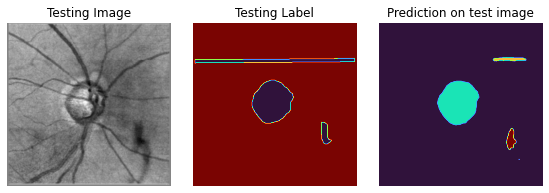

164 /198


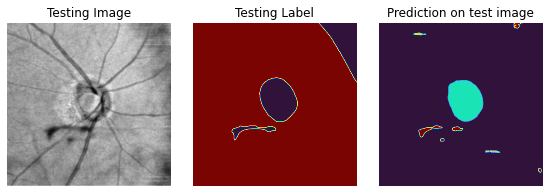

165 /198


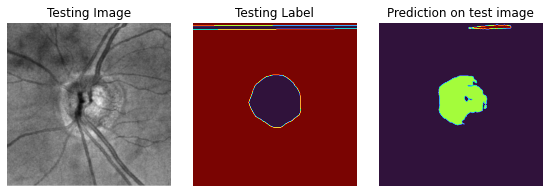

166 /198


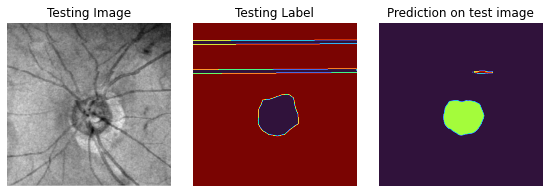

167 /198


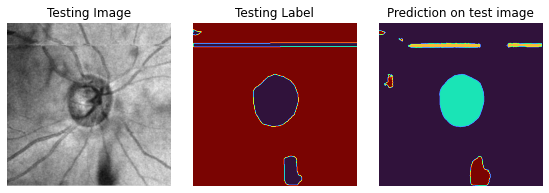

168 /198


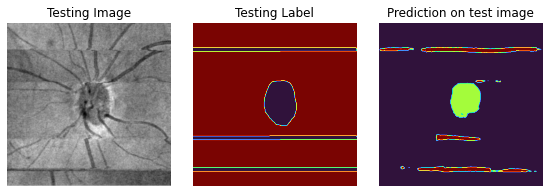

169 /198


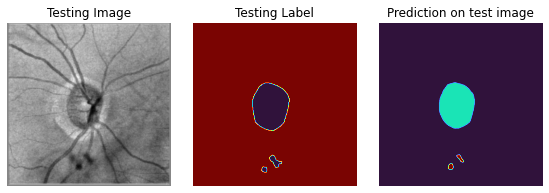

170 /198


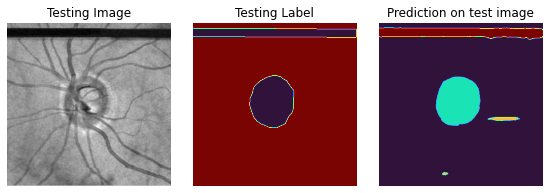

171 /198


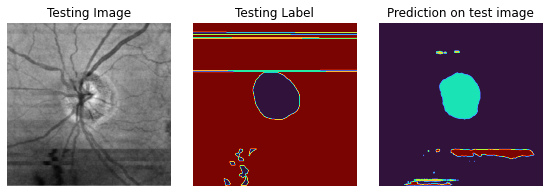

172 /198


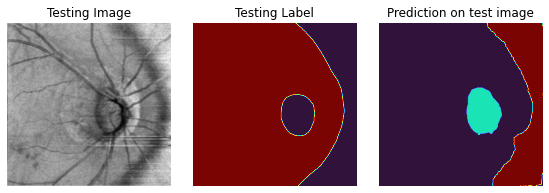

173 /198


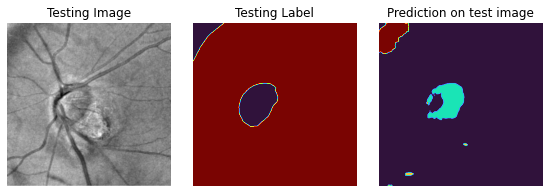

174 /198


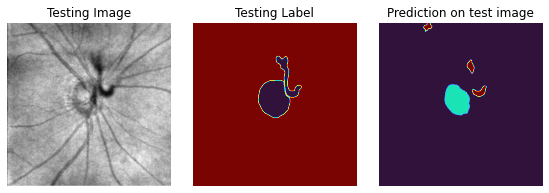

175 /198


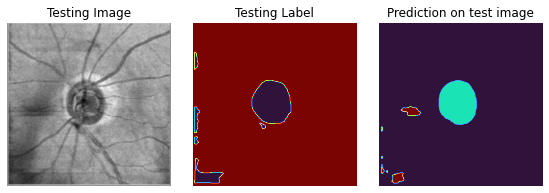

176 /198


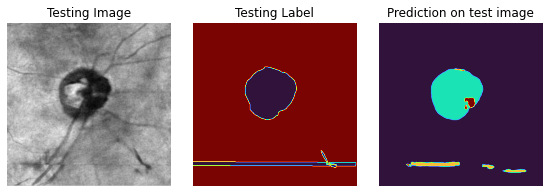

177 /198


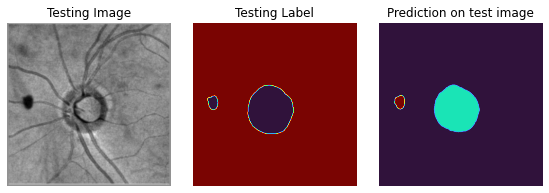

178 /198


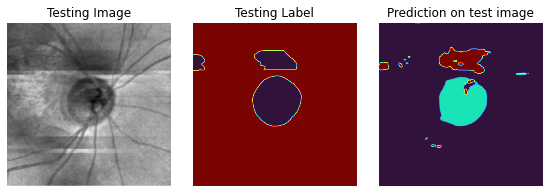

179 /198


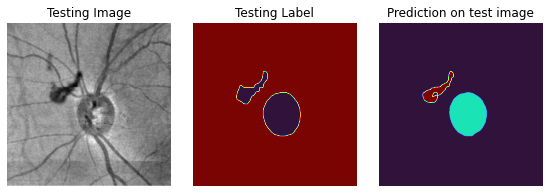

180 /198


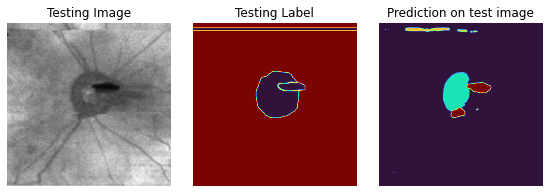

181 /198


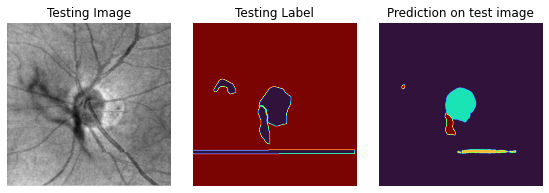

182 /198


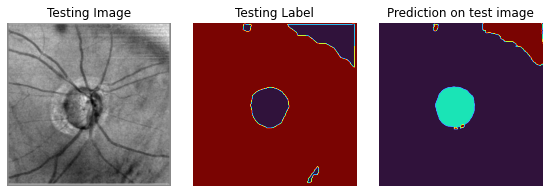

183 /198


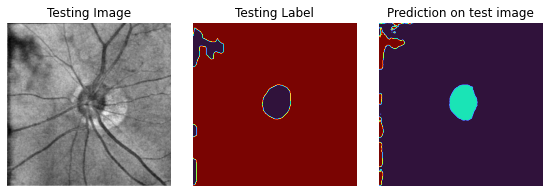

184 /198


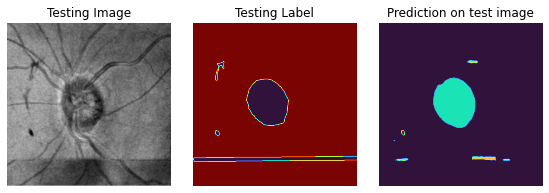

185 /198


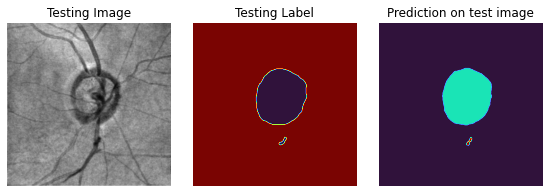

186 /198


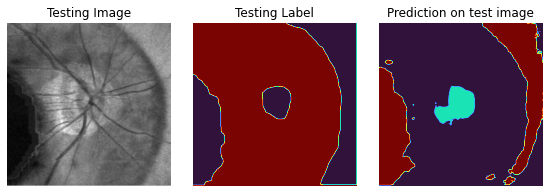

187 /198


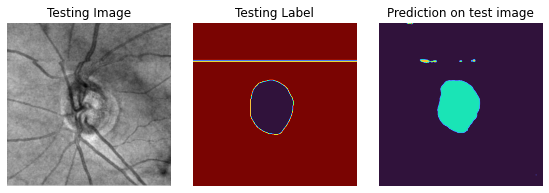

188 /198


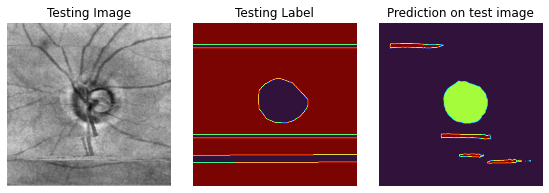

189 /198


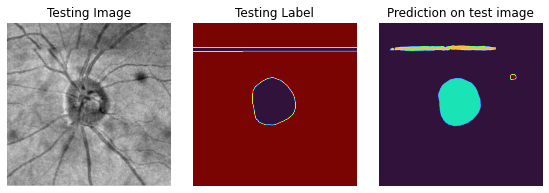

190 /198


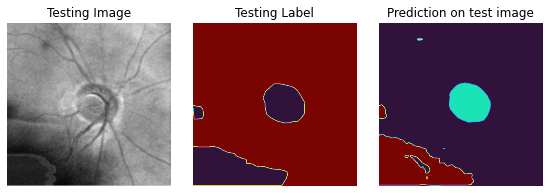

191 /198


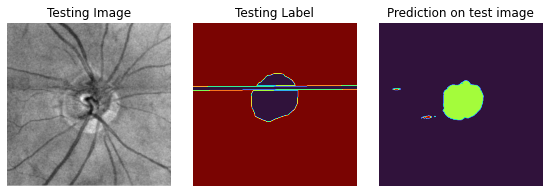

192 /198


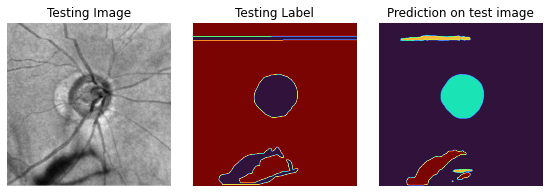

193 /198


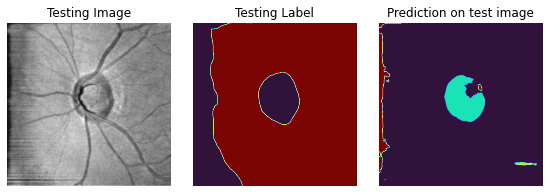

194 /198


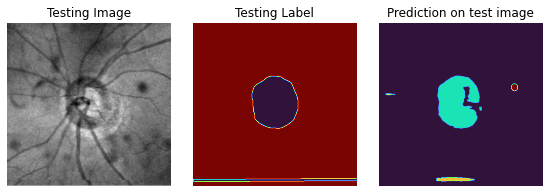

195 /198


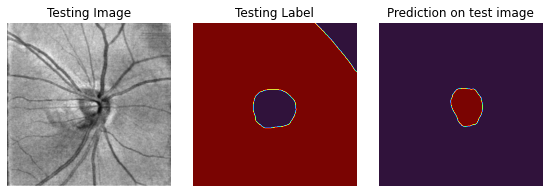

196 /198


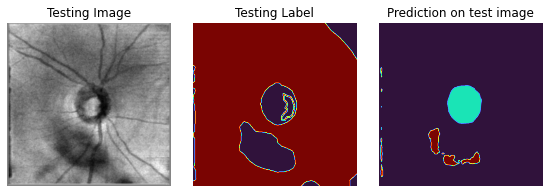

197 /198


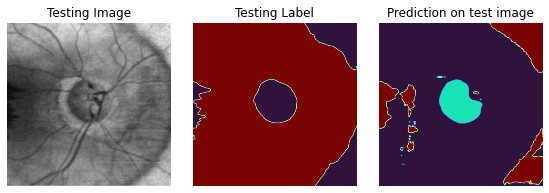

198 /198


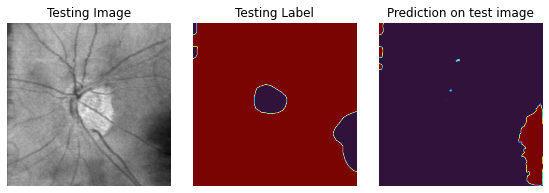

In [19]:
for i in range(198):
    TEST_IMG2 = X_test[i]
    GROUND_TRUTH2=y_test_cat[i]
    TEST_IMG_NORM2=TEST_IMG2[:,:,0][:,:,None]
    TEST_IMG_INPUT2=np.expand_dims(TEST_IMG_NORM2, 0)
    PREDICTION2 = (model.predict(TEST_IMG_INPUT2))
    PREDICTED_IMG2=np.argmax(PREDICTION2, axis=3)[0,:,:]
    
    print(i+1,"/198")
    plt.figure(figsize=(10,30))    
    plt.subplot(10,3,1)
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.title('Testing Image')
    plt.axis('off')
    plt.imshow(TEST_IMG2[:,:,0], cmap='gray')
    plt.subplot(10,3,2)
    plt.title('Testing Label')
    plt.axis('off')
    plt.imshow(GROUND_TRUTH2[:,:,0], cmap='turbo')
    plt.subplot(10,3,3)
    plt.title('Prediction on test image')
    plt.axis('off')
    plt.imshow(PREDICTED_IMG2, cmap='turbo')
    plt.show()

# test_img_number = random.randint(0, len(X_test)-1)
# test_img = X_test[test_img_number]
# ground_truth=y_test_cat[test_img_number]
# test_img_norm=test_img[:,:,0][:,:,None]
# test_img_input=np.expand_dims(test_img_norm, 0)
# prediction = (model.predict(test_img_input))
# predicted_img=np.argmax(prediction, axis=3)[0,:,:]

# plt.figure(figsize=(12, 8))
# plt.subplot(231)
# plt.title('Testing Image')
# plt.imshow(test_img[:,:,0], cmap='gray')
# plt.subplot(232)
# plt.title('Testing Label')
# plt.imshow(ground_truth[:,:,0], cmap='jet')
# plt.subplot(233)
# plt.title('Prediction on test image')
# plt.imshow(predicted_img, cmap='jet')
# plt.show()